# 📊 Sentiment Analysis: Deep Learning vs Machine Learning

Perbandingan model Deep Learning dan Machine Learning pada analisis sentimen ulasan aplikasi.

In [2]:
# Install packages if needed
# !pip install transformers scikit-learn pandas numpy matplotlib seaborn tensorflow nltk

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import nltk
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
nltk.download('stopwords')
from pathlib import Path
import re
import nltk
from nltk.tokenize import word_tokenize
nltk.download('all')
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
import swifter
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from wordcloud import WordCloud
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn import svm
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.metrics import accuracy_score
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch




[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Acer\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     C:\Users\Acer\AppData\Roaming\nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to
[nltk_data]    |     C:\Users\Acer\AppData\Roaming\nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     C:\Users\Acer\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_eng to
[nltk_data]    |     C:\Users\Acer\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_eng is already
[nltk_data]    |

In [3]:
df = pd.read_csv("gojek_reviews.csv")
df

,userName,score,content,at
0,Pengguna Google,3,"pelayanan lumayan bagus. tp kalau musim hujan,...",2025-04-11 10:56:39
1,Pengguna Google,5,customer service nya keren,2025-04-11 10:46:26
2,Pengguna Google,5,bagus bgt,2025-04-11 10:43:54
3,Pengguna Google,5,Terimakasih gojek. Driver handal,2025-04-11 10:42:28
4,Pengguna Google,5,membantu,2025-04-11 10:36:51
...,...,...,...,...
99995,hadi winardi,5,Praktis,2023-12-16 08:43:29
99996,Han,2,Tidak sesuai dengan harga yang di toko,2023-12-16 08:43:22
99997,Ismail Ismail,5,Gosen sangat membantu di saat saya sibuk dan h...,2023-12-16 08:42:03
99998,Rani I,5,"Kemana aja jadi mudah dengan adanya Gojek, pel...",2023-12-16 08:36:39


In [4]:
df.head()

,userName,score,content,at
0,Pengguna Google,3,"pelayanan lumayan bagus. tp kalau musim hujan,...",2025-04-11 10:56:39
1,Pengguna Google,5,customer service nya keren,2025-04-11 10:46:26
2,Pengguna Google,5,bagus bgt,2025-04-11 10:43:54
3,Pengguna Google,5,Terimakasih gojek. Driver handal,2025-04-11 10:42:28
4,Pengguna Google,5,membantu,2025-04-11 10:36:51


In [5]:
df.tail()

,userName,score,content,at
99995,hadi winardi,5,Praktis,2023-12-16 08:43:29
99996,Han,2,Tidak sesuai dengan harga yang di toko,2023-12-16 08:43:22
99997,Ismail Ismail,5,Gosen sangat membantu di saat saya sibuk dan h...,2023-12-16 08:42:03
99998,Rani I,5,"Kemana aja jadi mudah dengan adanya Gojek, pel...",2023-12-16 08:36:39
99999,cie nui,2,Tolong ya sebelumnya yg pembyaran pake gopay g...,2023-12-16 08:27:30


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 4 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   userName  100000 non-null  object
 1   score     100000 non-null  int64 
 2   content   99999 non-null   object
 3   at        100000 non-null  object
dtypes: int64(1), object(3)
memory usage: 3.1+ MB


## Check Missing Value

In [7]:
df.isnull().sum()

userName    0
score       0
content     1
at          0
dtype: int64

In [8]:
df['content'] = df['content'].fillna('ulasan kosong')

In [9]:
df.isnull().sum()

userName    0
score       0
content     0
at          0
dtype: int64

## CASEFOLDING

In [10]:
def cleaningulasan(ulasan):
  ulasan = re.sub(r'@[A-Za-a0-9]+',' ',ulasan)
  ulasan = re.sub(r'#[A-Za-z0-9]+',' ',ulasan)
  ulasan = re.sub(r"http\S+",' ',ulasan)
  ulasan = re.sub(r'[0-9]+',' ',ulasan)
  ulasan = re.sub(r"[-()\"#/@;:<>{}'+=~|.!?,_]", " ", ulasan)
  ulasan = ulasan.strip(' ')
  return ulasan
df['cleaning']= df['content'].apply(cleaningulasan)

def clearEmoji(ulasan):
    return ulasan.encode('ascii', 'ignore').decode('ascii')
df['hapusEmoji']= df['cleaning'].apply(clearEmoji)

def replaceTOM(ulasan):
    pola = re.compile(r'(.)\1{2,}', re.DOTALL)
    return pola.sub(r'\1', ulasan)
df['replaceTOM']= df['hapusEmoji'].apply(replaceTOM)

def casefoldingText(ulasan):
  ulasan = ulasan.lower()
  return ulasan
df['caseFolding']= df['replaceTOM'].apply(casefoldingText)

df

,userName,score,content,at,cleaning,hapusEmoji,replaceTOM,caseFolding
0,Pengguna Google,3,"pelayanan lumayan bagus. tp kalau musim hujan,...",2025-04-11 10:56:39,pelayanan lumayan bagus tp kalau musim hujan ...,pelayanan lumayan bagus tp kalau musim hujan ...,pelayanan lumayan bagus tp kalau musim hujan ...,pelayanan lumayan bagus tp kalau musim hujan ...
1,Pengguna Google,5,customer service nya keren,2025-04-11 10:46:26,customer service nya keren,customer service nya keren,customer service nya keren,customer service nya keren
2,Pengguna Google,5,bagus bgt,2025-04-11 10:43:54,bagus bgt,bagus bgt,bagus bgt,bagus bgt
3,Pengguna Google,5,Terimakasih gojek. Driver handal,2025-04-11 10:42:28,Terimakasih gojek Driver handal,Terimakasih gojek Driver handal,Terimakasih gojek Driver handal,terimakasih gojek driver handal
4,Pengguna Google,5,membantu,2025-04-11 10:36:51,membantu,membantu,membantu,membantu
...,...,...,...,...,...,...,...,...
99995,hadi winardi,5,Praktis,2023-12-16 08:43:29,Praktis,Praktis,Praktis,praktis
99996,Han,2,Tidak sesuai dengan harga yang di toko,2023-12-16 08:43:22,Tidak sesuai dengan harga yang di toko,Tidak sesuai dengan harga yang di toko,Tidak sesuai dengan harga yang di toko,tidak sesuai dengan harga yang di toko
99997,Ismail Ismail,5,Gosen sangat membantu di saat saya sibuk dan h...,2023-12-16 08:42:03,Gosen sangat membantu di saat saya sibuk dan h...,Gosen sangat membantu di saat saya sibuk dan h...,Gosen sangat membantu di saat saya sibuk dan h...,gosen sangat membantu di saat saya sibuk dan h...
99998,Rani I,5,"Kemana aja jadi mudah dengan adanya Gojek, pel...",2023-12-16 08:36:39,Kemana aja jadi mudah dengan adanya Gojek pel...,Kemana aja jadi mudah dengan adanya Gojek pel...,Kemana aja jadi mudah dengan adanya Gojek pel...,kemana aja jadi mudah dengan adanya gojek pel...


In [11]:
from nltk.tokenize import word_tokenize
# Paksa download dan set path
nltk.download('punkt')
nltk.data.path.append('C:/Users/Acer/AppData/Roaming/nltk_data')


def tokenizingText(ulasan):
    ulasan = word_tokenize(ulasan)
    return ulasan

df['tokenizing'] = df['caseFolding'].apply(tokenizingText)

df

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Acer\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


,userName,score,content,at,cleaning,hapusEmoji,replaceTOM,caseFolding,tokenizing
0,Pengguna Google,3,"pelayanan lumayan bagus. tp kalau musim hujan,...",2025-04-11 10:56:39,pelayanan lumayan bagus tp kalau musim hujan ...,pelayanan lumayan bagus tp kalau musim hujan ...,pelayanan lumayan bagus tp kalau musim hujan ...,pelayanan lumayan bagus tp kalau musim hujan ...,"[pelayanan, lumayan, bagus, tp, kalau, musim, ..."
1,Pengguna Google,5,customer service nya keren,2025-04-11 10:46:26,customer service nya keren,customer service nya keren,customer service nya keren,customer service nya keren,"[customer, service, nya, keren]"
2,Pengguna Google,5,bagus bgt,2025-04-11 10:43:54,bagus bgt,bagus bgt,bagus bgt,bagus bgt,"[bagus, bgt]"
3,Pengguna Google,5,Terimakasih gojek. Driver handal,2025-04-11 10:42:28,Terimakasih gojek Driver handal,Terimakasih gojek Driver handal,Terimakasih gojek Driver handal,terimakasih gojek driver handal,"[terimakasih, gojek, driver, handal]"
4,Pengguna Google,5,membantu,2025-04-11 10:36:51,membantu,membantu,membantu,membantu,[membantu]
...,...,...,...,...,...,...,...,...,...
99995,hadi winardi,5,Praktis,2023-12-16 08:43:29,Praktis,Praktis,Praktis,praktis,[praktis]
99996,Han,2,Tidak sesuai dengan harga yang di toko,2023-12-16 08:43:22,Tidak sesuai dengan harga yang di toko,Tidak sesuai dengan harga yang di toko,Tidak sesuai dengan harga yang di toko,tidak sesuai dengan harga yang di toko,"[tidak, sesuai, dengan, harga, yang, di, toko]"
99997,Ismail Ismail,5,Gosen sangat membantu di saat saya sibuk dan h...,2023-12-16 08:42:03,Gosen sangat membantu di saat saya sibuk dan h...,Gosen sangat membantu di saat saya sibuk dan h...,Gosen sangat membantu di saat saya sibuk dan h...,gosen sangat membantu di saat saya sibuk dan h...,"[gosen, sangat, membantu, di, saat, saya, sibu..."
99998,Rani I,5,"Kemana aja jadi mudah dengan adanya Gojek, pel...",2023-12-16 08:36:39,Kemana aja jadi mudah dengan adanya Gojek pel...,Kemana aja jadi mudah dengan adanya Gojek pel...,Kemana aja jadi mudah dengan adanya Gojek pel...,kemana aja jadi mudah dengan adanya gojek pel...,"[kemana, aja, jadi, mudah, dengan, adanya, goj..."


## Formalisasi

In [12]:
def convertToSlangword(ulasan):
    kamusSlang = eval(open("slangwords.txt").read())
    pattern = re.compile(r'\b( ' + '|'.join (kamusSlang.keys())+r')\b')
    content = []
    for kata in ulasan:
        filterSlang = pattern.sub(lambda x: kamusSlang[x.group()],kata)
        content.append(filterSlang.lower())
    ulasan = content
    return ulasan

df['formalisasi'] = df['tokenizing'].apply(convertToSlangword)

In [13]:
df

,userName,score,content,at,cleaning,hapusEmoji,replaceTOM,caseFolding,tokenizing,formalisasi
0,Pengguna Google,3,"pelayanan lumayan bagus. tp kalau musim hujan,...",2025-04-11 10:56:39,pelayanan lumayan bagus tp kalau musim hujan ...,pelayanan lumayan bagus tp kalau musim hujan ...,pelayanan lumayan bagus tp kalau musim hujan ...,pelayanan lumayan bagus tp kalau musim hujan ...,"[pelayanan, lumayan, bagus, tp, kalau, musim, ...","[pelayanan, lumayan, bagus, tapi, kalau, musim..."
1,Pengguna Google,5,customer service nya keren,2025-04-11 10:46:26,customer service nya keren,customer service nya keren,customer service nya keren,customer service nya keren,"[customer, service, nya, keren]","[konsumen, service, nya, keren]"
2,Pengguna Google,5,bagus bgt,2025-04-11 10:43:54,bagus bgt,bagus bgt,bagus bgt,bagus bgt,"[bagus, bgt]","[bagus, banget]"
3,Pengguna Google,5,Terimakasih gojek. Driver handal,2025-04-11 10:42:28,Terimakasih gojek Driver handal,Terimakasih gojek Driver handal,Terimakasih gojek Driver handal,terimakasih gojek driver handal,"[terimakasih, gojek, driver, handal]","[terima kasih, ojek online, pengendara, handal]"
4,Pengguna Google,5,membantu,2025-04-11 10:36:51,membantu,membantu,membantu,membantu,[membantu],[membantu]
...,...,...,...,...,...,...,...,...,...,...
99995,hadi winardi,5,Praktis,2023-12-16 08:43:29,Praktis,Praktis,Praktis,praktis,[praktis],[praktis]
99996,Han,2,Tidak sesuai dengan harga yang di toko,2023-12-16 08:43:22,Tidak sesuai dengan harga yang di toko,Tidak sesuai dengan harga yang di toko,Tidak sesuai dengan harga yang di toko,tidak sesuai dengan harga yang di toko,"[tidak, sesuai, dengan, harga, yang, di, toko]","[tidak, sesuai, dengan, harga, yang, di, toko]"
99997,Ismail Ismail,5,Gosen sangat membantu di saat saya sibuk dan h...,2023-12-16 08:42:03,Gosen sangat membantu di saat saya sibuk dan h...,Gosen sangat membantu di saat saya sibuk dan h...,Gosen sangat membantu di saat saya sibuk dan h...,gosen sangat membantu di saat saya sibuk dan h...,"[gosen, sangat, membantu, di, saat, saya, sibu...","[gosen, sangat, membantu, di, saat, saya, sibu..."
99998,Rani I,5,"Kemana aja jadi mudah dengan adanya Gojek, pel...",2023-12-16 08:36:39,Kemana aja jadi mudah dengan adanya Gojek pel...,Kemana aja jadi mudah dengan adanya Gojek pel...,Kemana aja jadi mudah dengan adanya Gojek pel...,kemana aja jadi mudah dengan adanya gojek pel...,"[kemana, aja, jadi, mudah, dengan, adanya, goj...","[kemana, saja, jadi, mudah, dengan, adanya, oj..."


## StopWord

In [14]:
from nltk.corpus import stopwords
nltk.download('stopwords')

daftar_stopword = stopwords.words('indonesian')
# ---------------------------- manualy add stopword  ------------------------------------
# append additional stopword
daftar_stopword.extend(["yg","dg","rt"])
daftar_stopword = set(daftar_stopword)

def stopwordText(words):
  print(words)
  return [word for word in words if word not in daftar_stopword]

df['stopwordRemoval'] = df['formalisasi'].apply(stopwordText)

# ulasan

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Acer\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


['pelayanan', 'lumayan', 'bagus', 'tapi', 'kalau', 'musim', 'hujan', 'susah', 'dapat', 'pengendara', 'dan', 'pengendara', 'gokarnya', 'gak', 'jujur', 'telpon', 'minta', 'harganya', 'naik', 'alasannya', 'macet']
['konsumen', 'service', 'nya', 'keren']
['bagus', 'banget']
['terima kasih', 'ojek online', 'pengendara', 'handal']
['membantu']
['sangat', 'membantu', 'sekali']
['mantapplah']
['aplikator', 'penipuan', 'pembagian', 'bhr', 'penipuan', 'tarif', 'bawah', 'dan', 'atas', 'murah', 'penipuan', 'program', 'pengendara', 'penipuan', 'promo', 'konsumen', 'penipuan', 'sistem', 'manipulasi', 'settingan', 'pembagian', 'orderan', 'culas', 'modifikasi', 'member', 'kantor', 'jarak', 'under', 'bayar', 'bulanan', 'harian', 'akun', 'joki', 'cepu', 'kantor', 'buatan', 'kantor', 'tuyul', 'kantor', 'gopay', 'by', 'pas', 'vermuk', 'bayar', 'ke', 'dalam', 'kantor', 'penipuan', 'riwayat', 'transaksi', 'order', 'dan', 'penipuan', 'performa', 'algoritma', 'penipuan', 'penipuan', 'jarak', 'jemput', 'jauh',

## Stemming

In [15]:
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
import swifter

factory = StemmerFactory()
stemmer = factory.create_stemmer()

def stemmed_wrapper(term):
    return stemmer.stem(term)

term_dict = {}

for document in df['stopwordRemoval']:
    for term in document:
        if term not in term_dict:
            term_dict[term] = ' '

for term in term_dict:
    term_dict[term] = stemmed_wrapper(term)
    print(term,":" ,term_dict[term])
    
def stemmingText(document):
    return [term_dict[term] for term in document]

df['stemming'] =df['stopwordRemoval'].swifter.apply(stemmingText)

pelayanan : layan
lumayan : lumayan
bagus : bagus
musim : musim
hujan : hujan
susah : susah
pengendara : kendara
gokarnya : gokar
gak : gak
jujur : jujur
telpon : telpon
harganya : harga
alasannya : alas
macet : macet
konsumen : konsumen
service : service
nya : nya
keren : keren
banget : banget
terima kasih : terima kasih
ojek online : ojek online
handal : handal
membantu : bantu
mantapplah : mantapplah
aplikator : aplikator
penipuan : tipu
pembagian : bagi
bhr : bhr
tarif : tarif
murah : murah
program : program
promo : promo
sistem : sistem
manipulasi : manipulasi
settingan : settingan
orderan : order
culas : culas
modifikasi : modifikasi
member : member
kantor : kantor
jarak : jarak
under : under
bayar : bayar
bulanan : bulan
harian : hari
akun : akun
joki : joki
cepu : cepu
buatan : buat
tuyul : tuyul
gopay : gopay
by : by
pas : pas
vermuk : vermuk
riwayat : riwayat
transaksi : transaksi
order : order
performa : performa
algoritma : algoritma
jemput : jemput
nganter : nganter
ongkos

Pandas Apply: 100%|██████████| 100000/100000 [00:02<00:00, 47758.75it/s]


In [16]:
df['stemming']

0        [layan, lumayan, bagus, musim, hujan, susah, k...
1                          [konsumen, service, nya, keren]
2                                          [bagus, banget]
3             [terima kasih, ojek online, kendara, handal]
4                                                  [bantu]
                               ...                        
99995                                            [praktis]
99996                                [sesuai, harga, toko]
99997    [gosen, bantu, sibuk, kirim, paket, barang, te...
99998    [mana, mudah, ojek online, layan, kendara, dis...
99999    [tolong, iya, pembyaran, pakai, gopay, gagal, ...
Name: stemming, Length: 100000, dtype: object

## Visualisasi

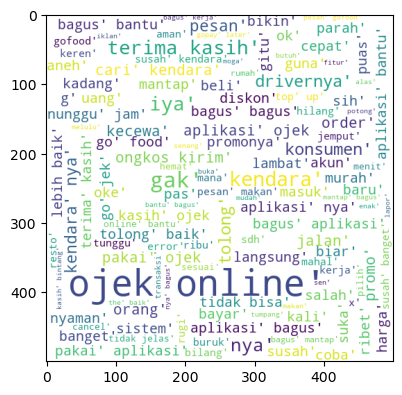

In [17]:
stemm_list = df['stemming'].tolist()
stemm_ls = []
for w in stemm_list:
  stemm_ls += w

from wordcloud import WordCloud
wc=WordCloud(width=500,height=500,min_font_size=10,background_color='white')
#content
stemming=wc.generate(str(stemm_ls))
plt.figure(figsize=(4.5,4.5))
plt.imshow(stemming)

Dari Hasil Diatas kata yang paling dominan di sebutkan adalah kata ojek dan online

Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


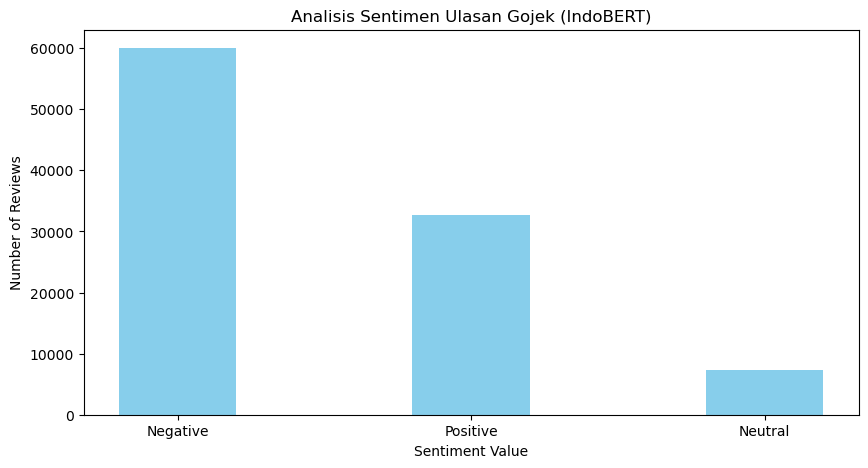

In [21]:
# # Konversi skor menjadi label sentimen
# def label_sentiment(score):
#     if score <= 2:
#         return 'Negative'
#     elif score == 3:
#         return 'Neutral'
#     else:
#         return 'Positive'

# # Tambahkan kolom 'label' berdasarkan kolom 'score'
# df['label'] = df['score'].apply(label_sentiment)

# # Hitung jumlah masing-masing label
# negative_label = df[df['label'] == 'Negative']['label'].count()
# positive_label = df[df['label'] == 'Positive']['label'].count()
# neutral_label = df[df['label'] == 'Neutral']['label'].count()

# # Siapkan label dan value untuk chart
# label = ['Negative', 'Positive', 'Neutral']
# values = [negative_label, positive_label, neutral_label]

# # Buat bar chart
# fig = plt.figure(figsize=(10, 5))
# plt.bar(label, values, color='blue', width=0.4)
# plt.xlabel("Sentiment Value")
# plt.ylabel("Number of Reviews")
# plt.title("Perbandingan Jumlah Positif, Negatif, dan Netral")
# plt.show()

# Load IndoBERT untuk analisis sentimen
model_name = "mdhugol/indonesia-bert-sentiment-classification"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name)

# Fungsi analisis sentimen
def label_sentiment(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True)
    with torch.no_grad():
        outputs = model(**inputs)
        probs = torch.nn.functional.softmax(outputs.logits, dim=1)
        label = torch.argmax(probs, dim=1).item()
    
    if label == 0:
        return 'Negative'
    elif label == 1:
        return 'Neutral'
    elif label == 2:
        return 'Positive'

# Terapkan ke dataset kamu
df['label'] = df['content'].apply(label_sentiment)

# Hitung jumlah masing-masing label
label_counts = df['label'].value_counts()
labels = ['Negative', 'Positive', 'Neutral']
values = [label_counts.get(label, 0) for label in labels]

# Visualisasi hasilnya
plt.figure(figsize=(10, 5))
plt.bar(labels, values, color='skyblue', width=0.4)
plt.xlabel("Sentiment Value")
plt.ylabel("Number of Reviews")
plt.title("Analisis Sentimen Ulasan Gojek (IndoBERT)")
plt.show()


Pelabelan ini menggunakan salah satu model BERT yaitu indoBERT

In [22]:
X = df['stemming']
Y = df['label']

x_train, x_test, y_train, y_test = model_selection.train_test_split(X, Y, test_size=0.3, random_state=64)

nnn = x_test.sample(1).iloc[0]

def dummy_fun(doc):
    return doc

vectorizer = TfidfVectorizer(analyzer='word',
    tokenizer=dummy_fun,
    preprocessor=dummy_fun,
    token_pattern=None)
x_train = vectorizer.fit_transform(x_train)
x_test = vectorizer.transform(x_test)
Encoder = LabelEncoder()
y_train = Encoder.fit_transform(y_train)
y_test = Encoder.fit_transform(y_test)

print("Hasil TF-IDF:")
print(vectorizer.transform(nnn))

Hasil TF-IDF:
  (0, 1)	0.5234164654357064
  (0, 1069)	0.5194764108923844
  (0, 4977)	0.4170436442274299
  (0, 14130)	0.5312758803547019


In [23]:
SVM = svm.SVC(kernel='rbf', probability=True)
SVM.fit(x_train,y_train)

y_pred_svm = SVM.predict(x_test)

acc_score = cross_val_score(SVM, x_train, y_train, cv=3, scoring='accuracy')

print('Hasil Rata - Rata Accuracy : %s' % acc_score.mean())

Hasil Rata - Rata Accuracy : 0.8895000156689598


In [24]:
# Inisiasi MultinomialNB
mnb = MultinomialNB()

# Fit model
mnb.fit(x_train, y_train)

y_pred_nb = mnb.predict(x_test)

# Evaluasi akurasi data training
acc_score_nb = cross_val_score(mnb, x_train, y_train, cv=3, scoring='accuracy')
# acc_test = accuracy_score(y_test, y_pred_nb)

# Print hasil evaluasi
print(f'Hasil akurasi data test: {acc_score_nb.mean()}')

Hasil akurasi data test: 0.8779000146438317


In [25]:
# Inisiasi Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit model ke data training
rf.fit(x_train, y_train)

# Prediksi data test
y_pred_rf = rf.predict(x_test)

# Evaluasi akurasi data training dengan cross-validation
acc_score_rf = cross_val_score(rf, x_train, y_train, cv=3, scoring='accuracy')

# Print hasil evaluasi
print(f'Hasil akurasi data test (Random Forest): {acc_score_rf.mean()}')

Hasil akurasi data test (Random Forest): 0.8754571452552543


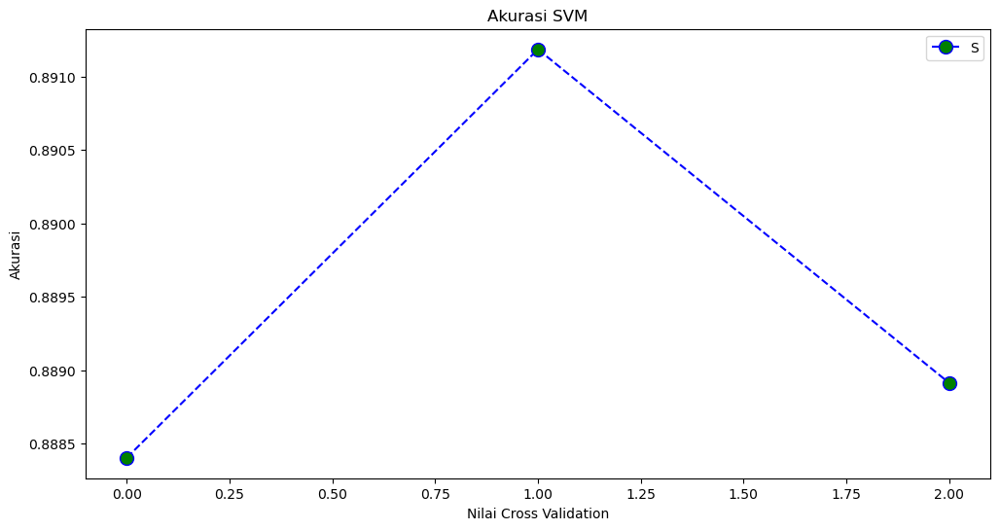

In [26]:
plt.figure(figsize=(12, 6))  
plt.plot(range(len(acc_score)), acc_score, color='blue', linestyle='dashed', marker='o',  
         markerfacecolor='green', markersize=10)
plt.title('Akurasi SVM')  
plt.xlabel('Nilai Cross Validation')  
plt.ylabel('Akurasi')
# plt.ylim(ymin=0, ymax=1)
plt.legend('SVM')

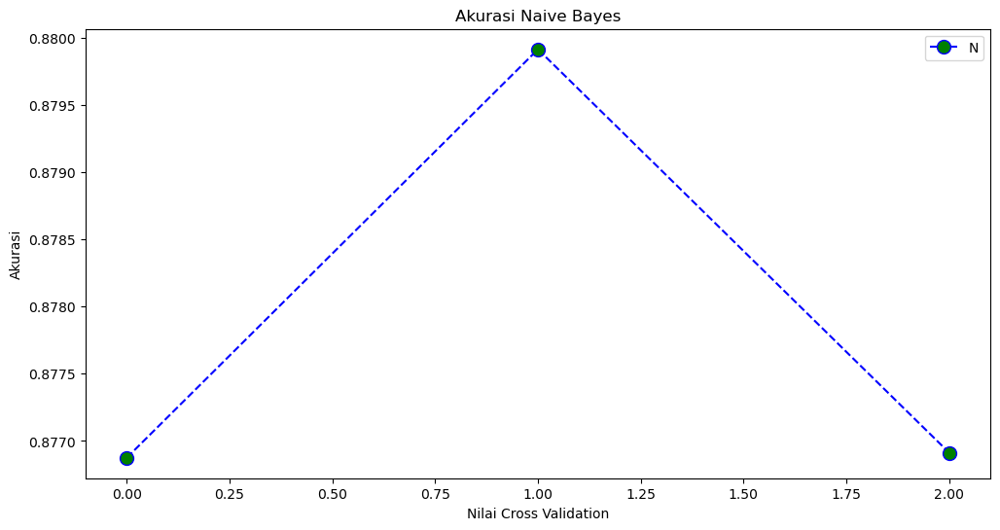

In [27]:
plt.figure(figsize=(12, 6))  
plt.plot(range(len(acc_score_nb)), acc_score_nb, color='blue', linestyle='dashed', marker='o',  
         markerfacecolor='green', markersize=10)
plt.title('Akurasi Naive Bayes')  
plt.xlabel('Nilai Cross Validation')  
plt.ylabel('Akurasi')
# plt.ylim(ymin=0, ymax=1)
plt.legend('Naive Bayes')

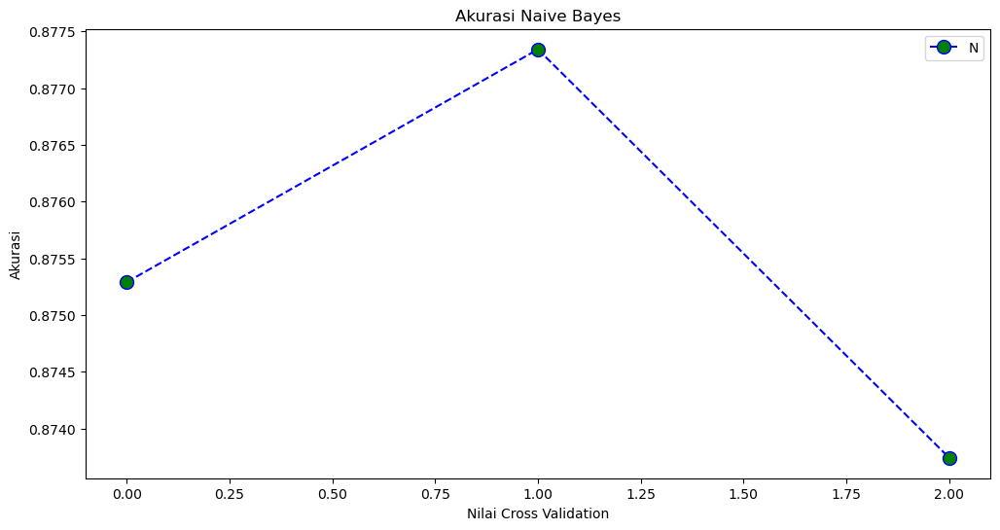

In [28]:
plt.figure(figsize=(12, 6))  
plt.plot(range(len(acc_score_rf)), acc_score_rf, color='blue', linestyle='dashed', marker='o',  
         markerfacecolor='green', markersize=10)
plt.title('Akurasi Naive Bayes')  
plt.xlabel('Nilai Cross Validation')  
plt.ylabel('Akurasi')
# plt.ylim(ymin=0, ymax=1)
plt.legend('Naive Bayes')

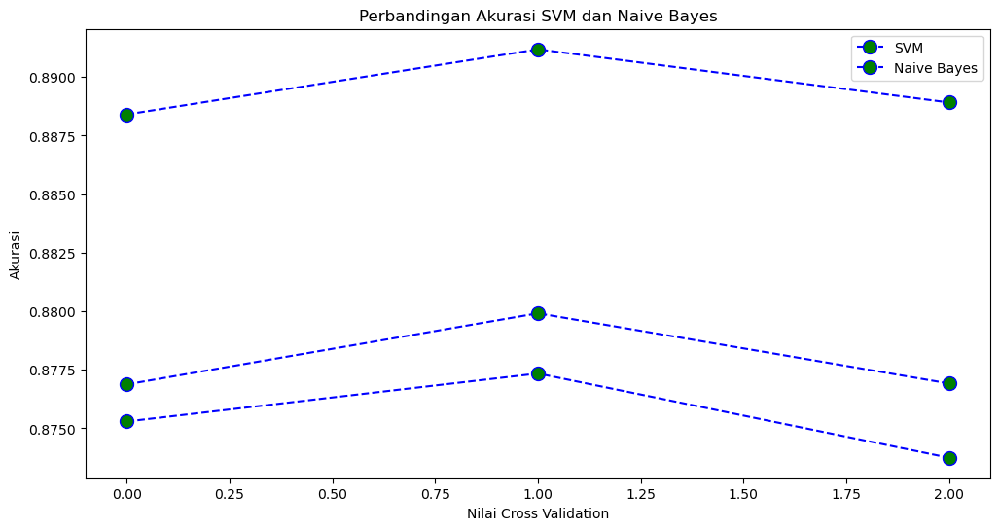

In [29]:
plt.figure(figsize=(12, 6))  
plt.plot(range(len(acc_score)), acc_score, color='blue', linestyle='dashed', marker='o',  
         markerfacecolor='green', markersize=10)
plt.plot(range(len(acc_score_nb)), acc_score_nb, color='blue', linestyle='dashed', marker='o',  
         markerfacecolor='green', markersize=10)
plt.plot(range(len(acc_score_rf)), acc_score_rf, color='blue', linestyle='dashed', marker='o',  
         markerfacecolor='green', markersize=10)
plt.title('Perbandingan Akurasi SVM dan Naive Bayes')  
plt.xlabel('Nilai Cross Validation')  
plt.ylabel('Akurasi')
# plt.ylim(ymin=0, ymax=1)
plt.legend(['SVM', 'Naive Bayes'])

In [30]:
from sklearn.metrics import classification_report

print('SVM')
print(classification_report(y_test, y_pred_svm))
print('Naive Bayes')
print(classification_report(y_test, y_pred_nb))
print('Random Forest')
print(classification_report(y_test, y_pred_rf))

SVM
              precision    recall  f1-score   support

           0       0.94      0.96      0.95     17981
           1       0.69      0.21      0.32      2243
           2       0.83      0.93      0.88      9776

    accuracy                           0.89     30000
   macro avg       0.82      0.70      0.72     30000
weighted avg       0.88      0.89      0.88     30000

Naive Bayes
              precision    recall  f1-score   support

           0       0.92      0.95      0.94     17981
           1       0.92      0.02      0.04      2243
           2       0.79      0.92      0.85      9776

    accuracy                           0.87     30000
   macro avg       0.88      0.63      0.61     30000
weighted avg       0.88      0.87      0.84     30000

Random Forest
              precision    recall  f1-score   support

           0       0.93      0.94      0.94     17981
           1       0.59      0.14      0.22      2243
           2       0.80      0.92      0.86  

## Kesimpulan

Dari penelitian ini dapat disimpulkan bahwa dalam kasus analisis sentimen dengan dataset berupa ulasan pengguna Gojek dari Play Store, algoritma Support Vector Machine (SVM) dengan akurasi 89% memberikan hasil yang lebih baik 1% dibandingkan dengan algoritma Random Forest yang memiliki akurasi sebesar 88%, serta setara dengan algoritma Naïve Bayes yang juga mencapai akurasi 89%. 